In [1]:
!pip install mrcnn

In [2]:
import os
from pathlib import Path
import cv2
import mrcnn.config
import mrcnn.utils
from mrcnn.model import MaskRCNN
import numpy as np
import sys
sys.path.insert(0, 'tpu/models/official')
sys.path.insert(0, 'tpu/models/official/mask_rcnn')
#import flask
#from flask import  Flask,render_template,request

Using TensorFlow backend.


In [0]:
# app = Flask(__name__)

In [0]:
# @app.route('/')
# @app.route('/index')
# def index():
#   return flask.render_template('index.html')

In [0]:
ID_MAPPING = {
    1: 'person',
    2: 'bicycle',
    3: 'car',
    4: 'motorcycle',
    5: 'airplane',
    6: 'bus',
    7: 'train',
    8: 'truck',
    9: 'boat',
    10: 'traffic light',
    11: 'fire hydrant',
    13: 'stop sign',
    14: 'parking meter',
    15: 'bench',
    16: 'bird',
    17: 'cat',
    18: 'dog',
    19: 'horse',
    20: 'sheep',
    21: 'cow',
    22: 'elephant',
    23: 'bear',
    24: 'zebra',
    25: 'giraffe',
    27: 'backpack',
    28: 'umbrella',
    31: 'handbag',
    32: 'tie',
    33: 'suitcase',
    34: 'frisbee',
    35: 'skis',
    36: 'snowboard',
    37: 'sports ball',
    38: 'kite',
    39: 'baseball bat',
    40: 'baseball glove',
    41: 'skateboard',
    42: 'surfboard',
    43: 'tennis racket',
    44: 'bottle',
    46: 'wine glass',
    47: 'cup',
    48: 'fork',
    49: 'knife',
    50: 'spoon',
    51: 'bowl',
    52: 'banana',
    53: 'apple',
    54: 'sandwich',
    55: 'orange',
    56: 'broccoli',
    57: 'carrot',
    58: 'hot dog',
    59: 'pizza',
    60: 'donut',
    61: 'cake',
    62: 'chair',
    63: 'couch',
    64: 'potted plant',
    65: 'bed',
    67: 'dining table',
    70: 'toilet',
    72: 'tv',
    73: 'laptop',
    74: 'mouse',
    75: 'remote',
    76: 'keyboard',
    77: 'cell phone',
    78: 'microwave',
    79: 'oven',
    80: 'toaster',
    81: 'sink',
    82: 'refrigerator',
    84: 'book',
    85: 'clock',
    86: 'vase',
    87: 'scissors',
    88: 'teddy bear',
    89: 'hair drier',
    90: 'toothbrush',
}
category_index = {k: {'id': k, 'name': ID_MAPPING[k]} for k in ID_MAPPING}

In [0]:
class MaskRCNNConfig(mrcnn.config.Config):
    NAME = "coco_pretrained_model_config"
    IMAGES_PER_GPU = 1
    GPU_COUNT = 1
    NUM_CLASSES = 1 + 80  # COCO dataset has 80 classes + one background class
    DETECTION_MIN_CONFIDENCE = 0.6

In [0]:
def get_car_boxes(boxes, class_ids):
    car_boxes = []

    for i, box in enumerate(boxes):
        # If the detected object isn't a car / truck or bus then skip it
        if class_ids[i] in [2,3,4, 8, 6]:
            car_boxes.append(box)

    return np.array(car_boxes)

In [0]:
Root_Dir = Path(".")  


Model_Dir = os.path.join(Root_Dir, "logs")

# Local path to trained weights file
Coco_Model_Path = os.path.join(Root_Dir, "mask_rcnn_coco.h5")

# Download COCO trained weights
if not os.path.exists(Coco_Model_Path):
    mrcnn.utils.download_trained_weights(Coco_Model_Path)

# Directory of images to run detection on / These images are created during the creation of frames
IMAGE_DIR = os.path.join(Root_Dir, "images")

In [9]:
from google.colab import drive
drive.mount('/content/drive')

KeyboardInterrupt: ignored

In [10]:
dir

<function dir>

In [0]:
!dir

In [0]:
Video = "final_5e25f8e30c506900166f6507_394297.mp4"

In [12]:

model = MaskRCNN(mode="inference", model_dir=Model_Dir, config=MaskRCNNConfig())








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [13]:
model.load_weights(Coco_Model_Path, by_name=True)


In [0]:
parked_car_boxes = None

In [0]:
video_capture = cv2.VideoCapture(Video)

In [0]:
from google.colab.patches import cv2_imshow

In [0]:
from mrcnn import visualize

Safe


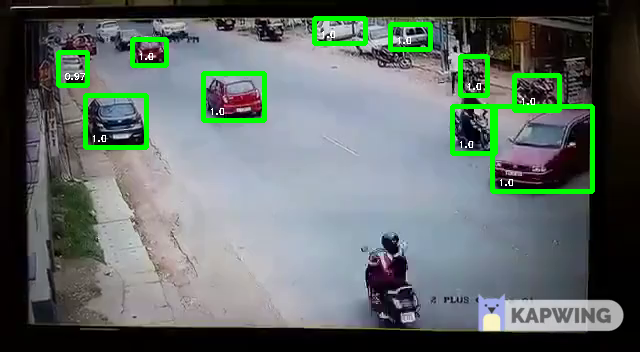

Safe


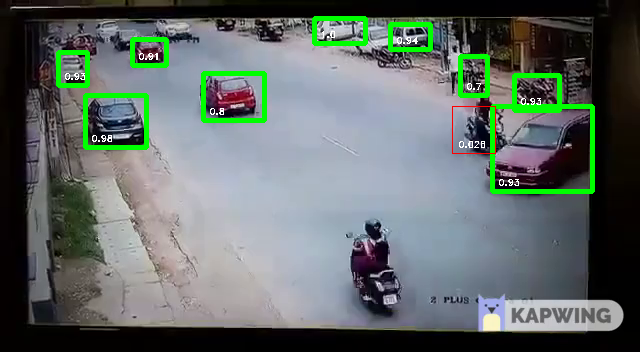

Safe


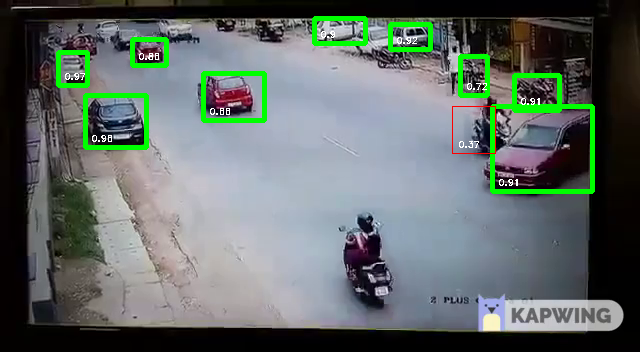

Safe


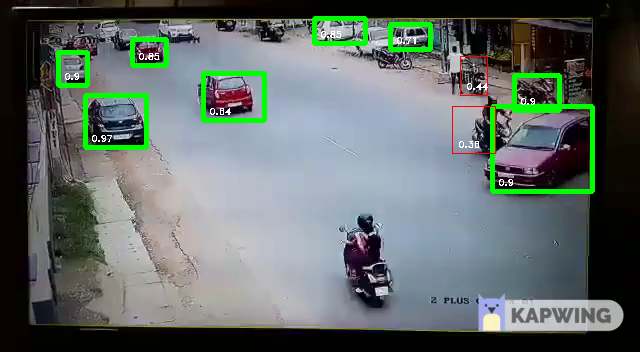

Safe


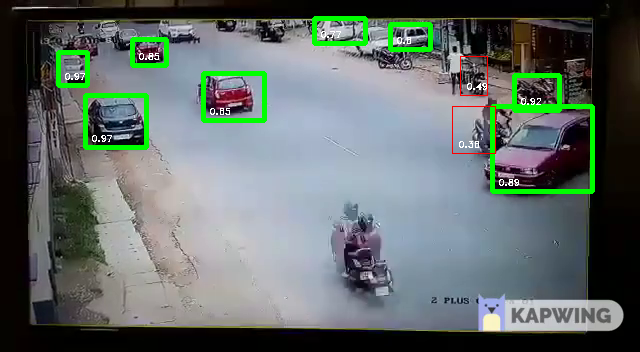

Safe


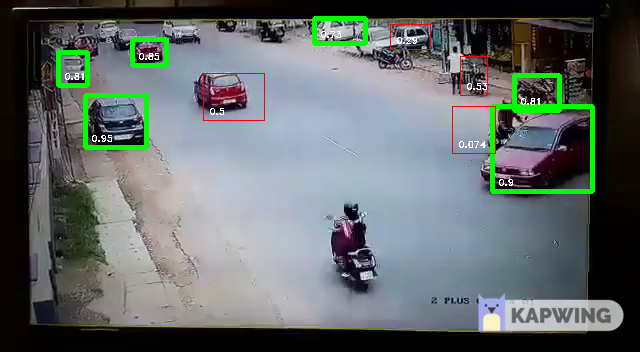

Safe


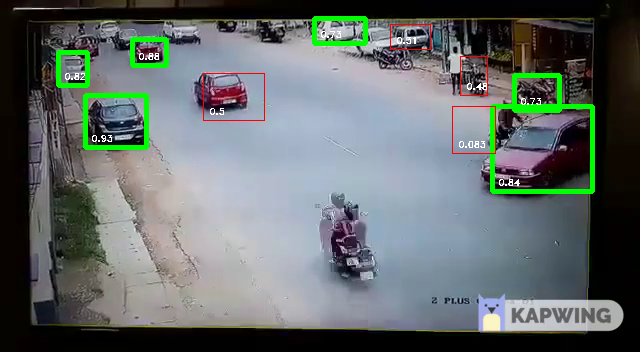

Safe


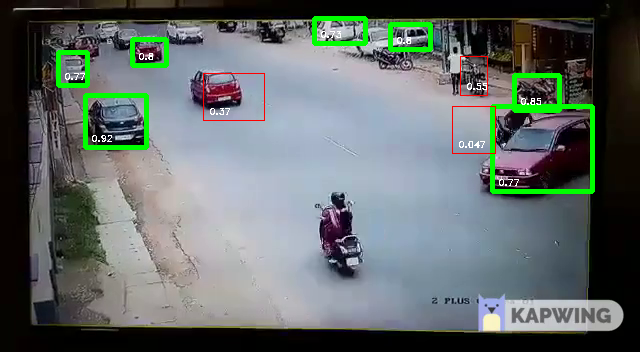

Safe


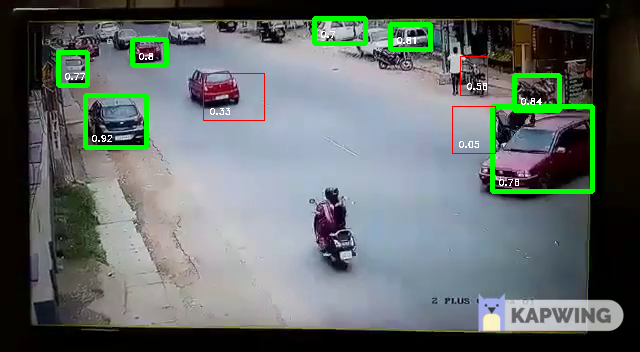

Safe


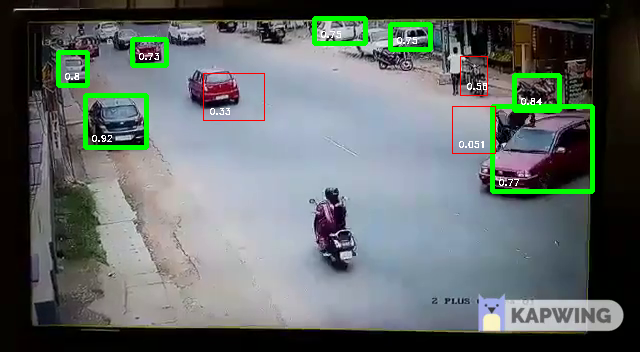

Safe


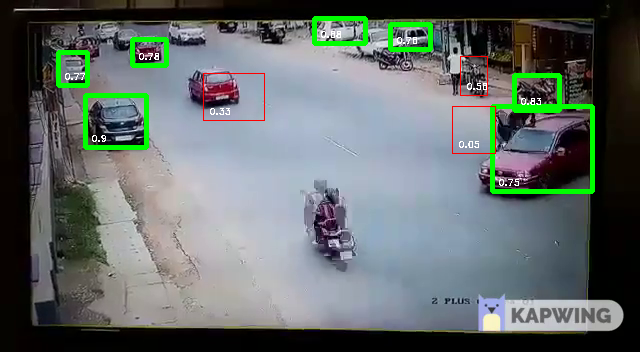

Safe


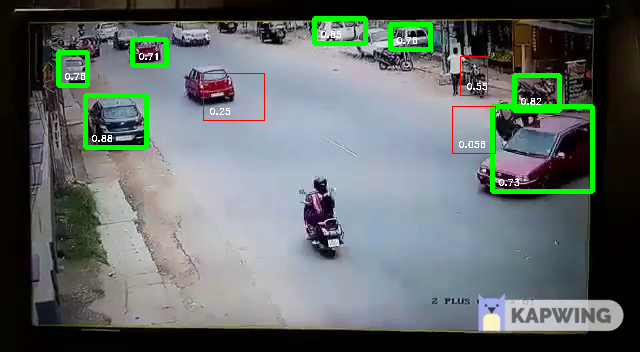

Safe


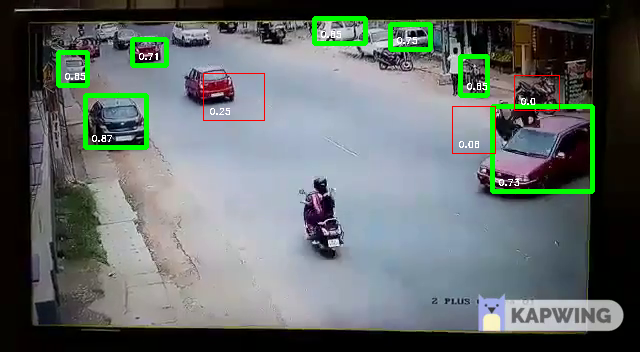

Safe


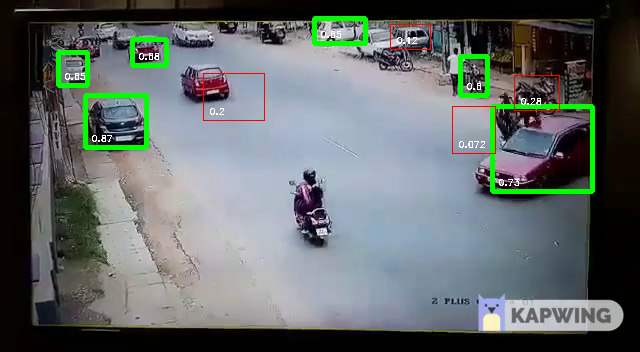

Safe


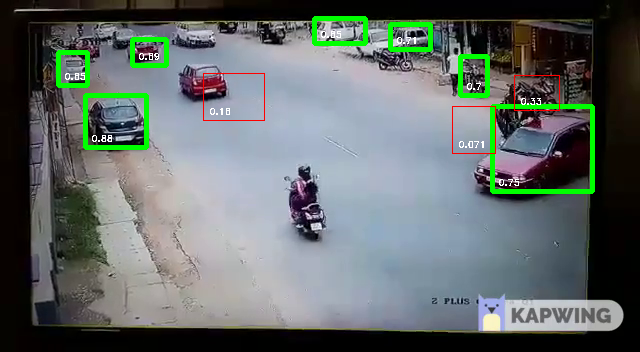

Safe


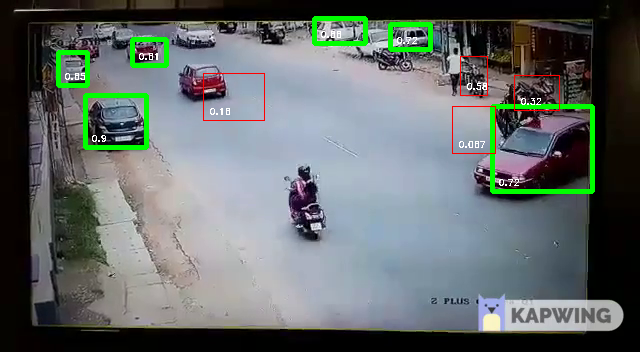

Safe


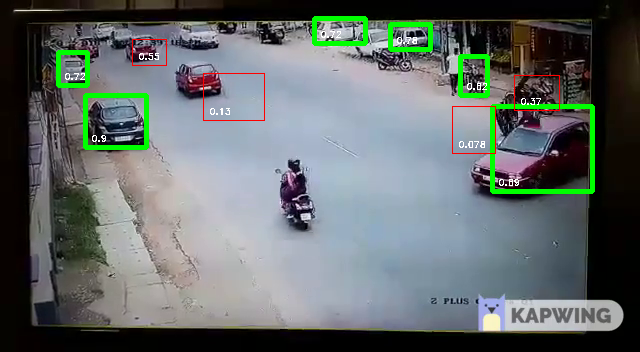

Safe


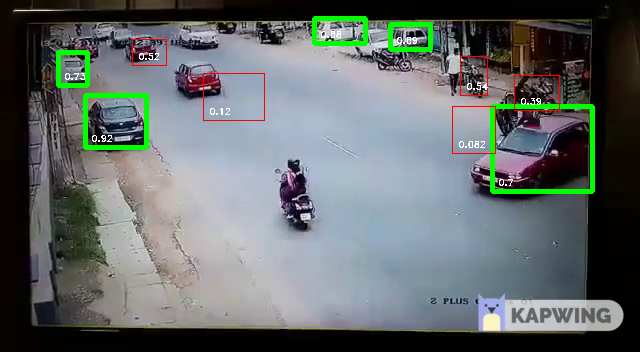

Safe


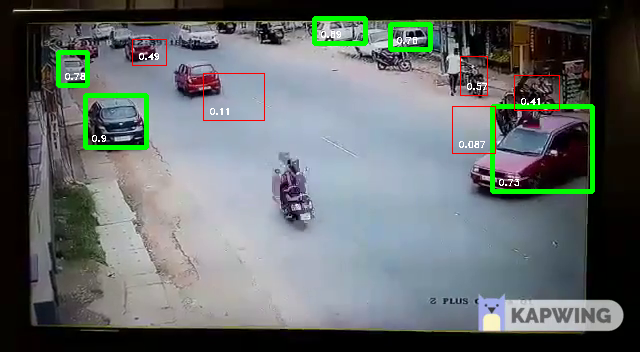

Safe


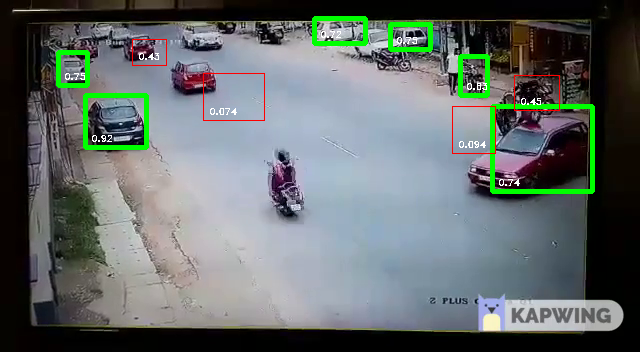

Safe


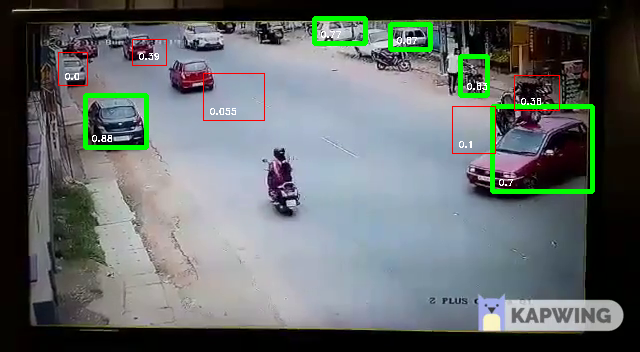

Safe


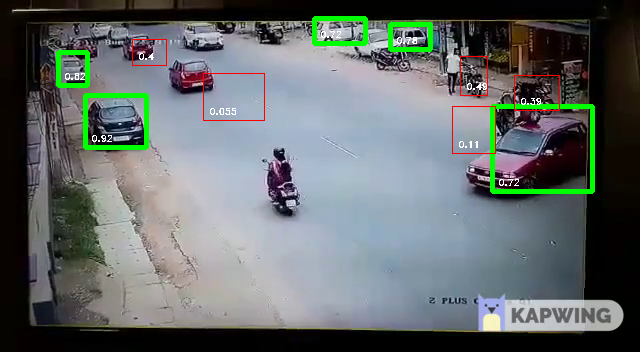

Safe


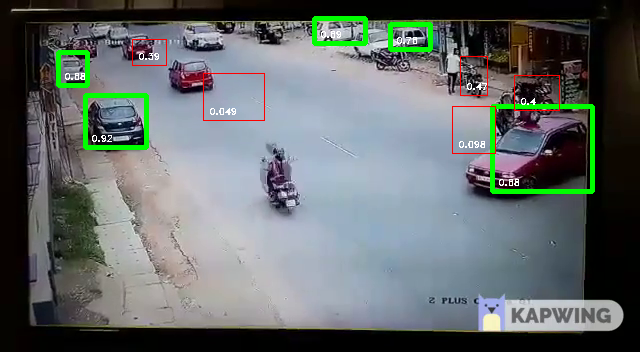

Safe


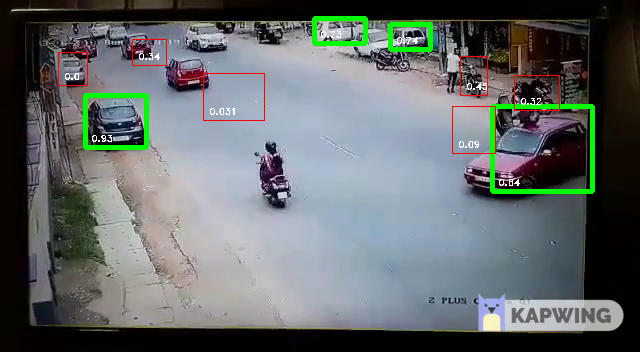

Safe


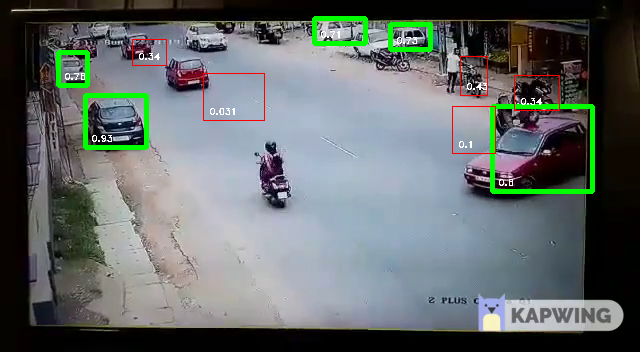

Safe


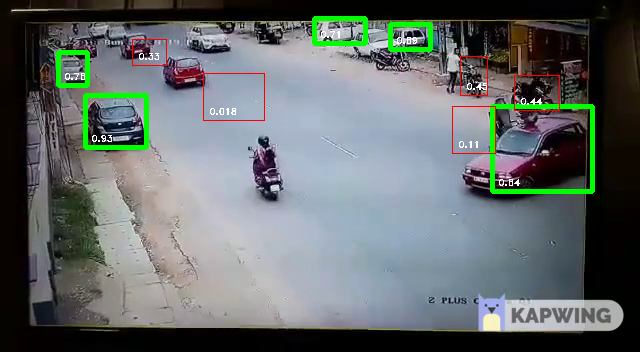

Safe


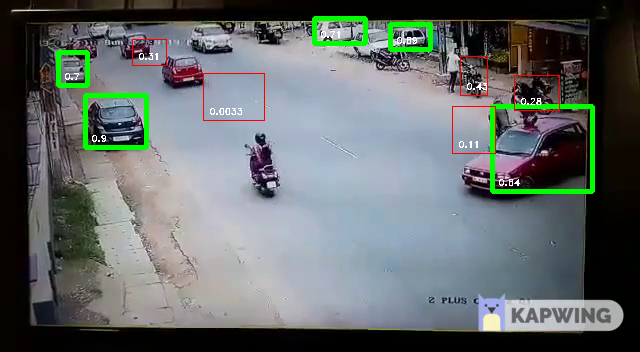

Safe


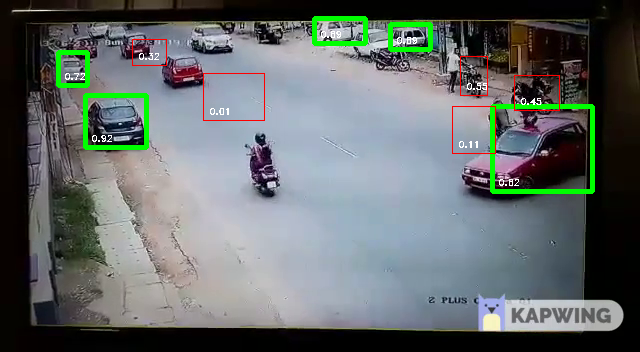

Safe


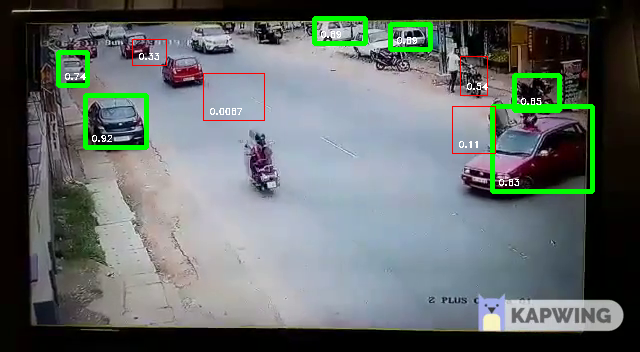

Safe


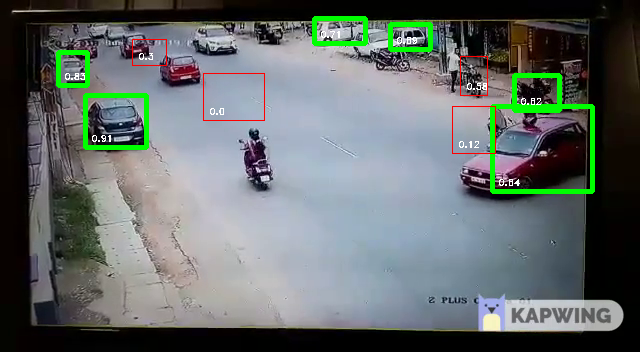

Safe


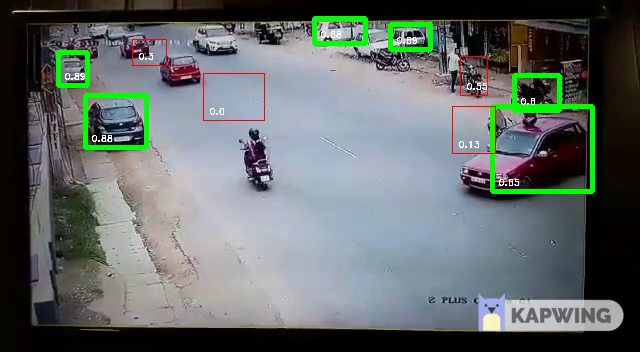

Safe


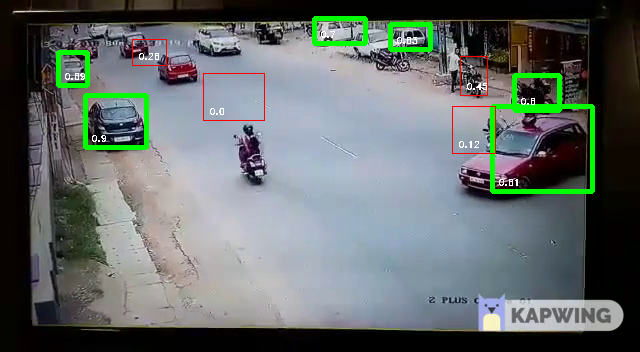

Safe


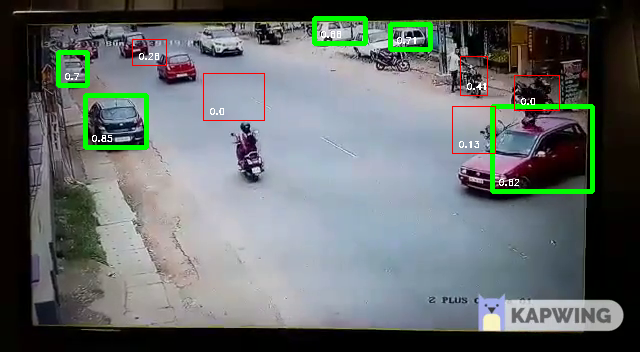

Safe


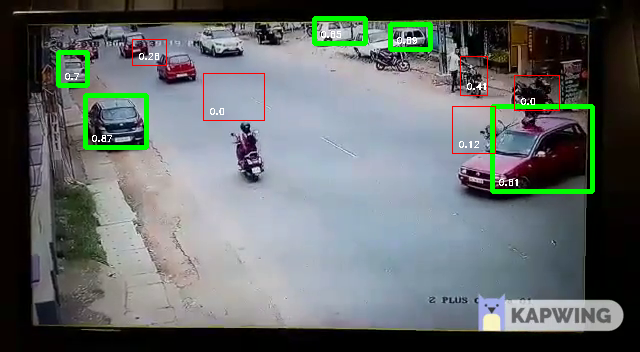

Safe


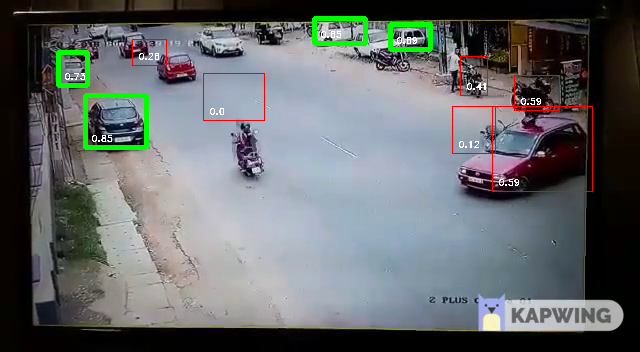

Safe


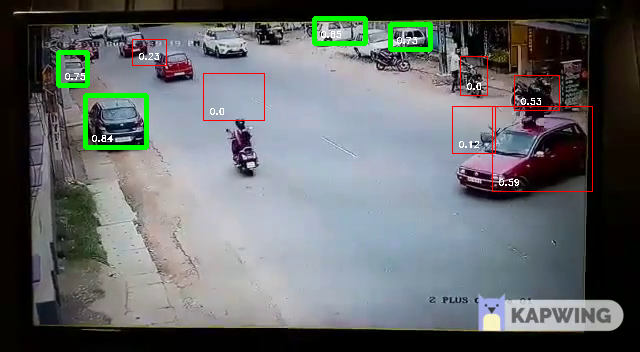

Safe


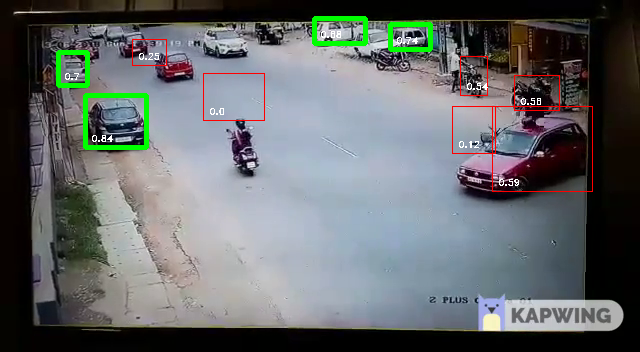

Safe


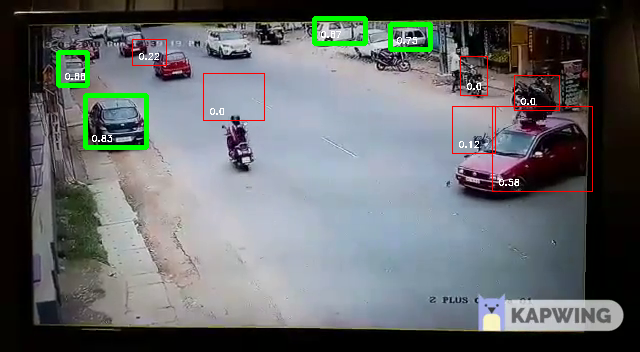

Safe


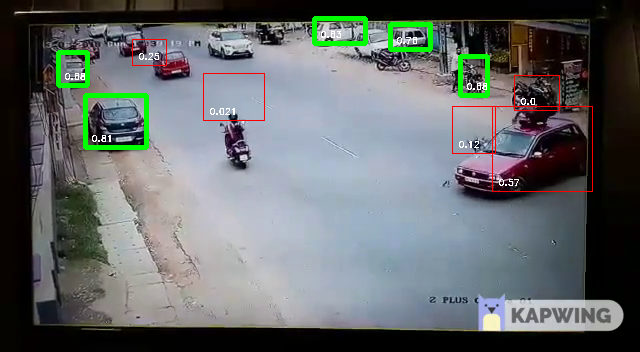

Safe


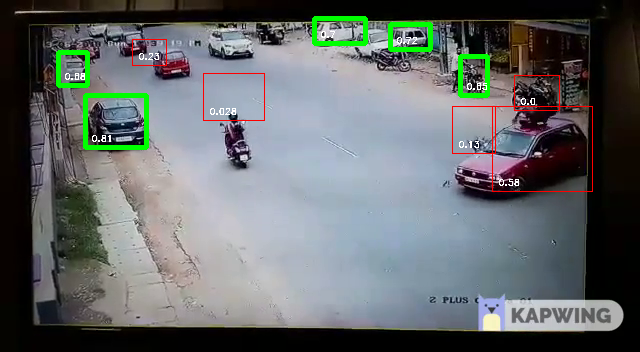

Safe


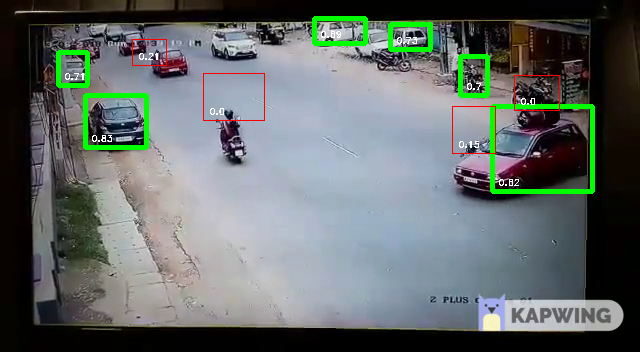

Safe


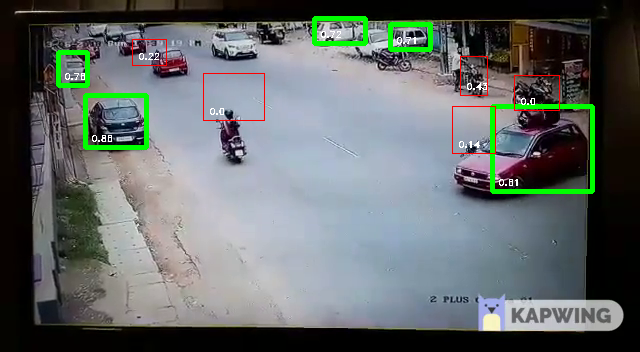

Safe


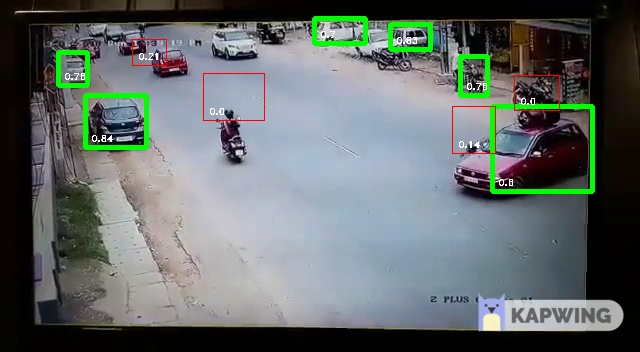

Safe


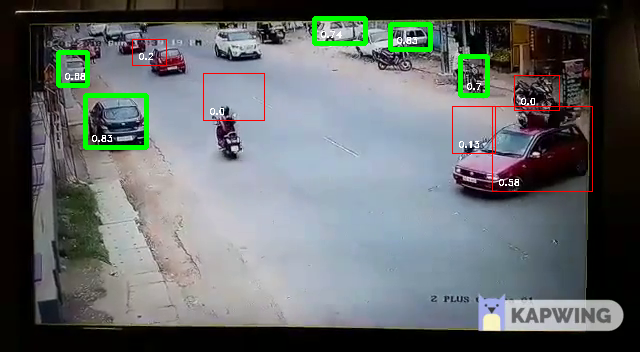

Safe


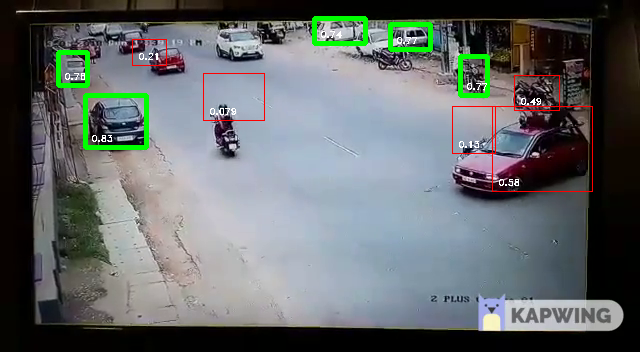

Safe


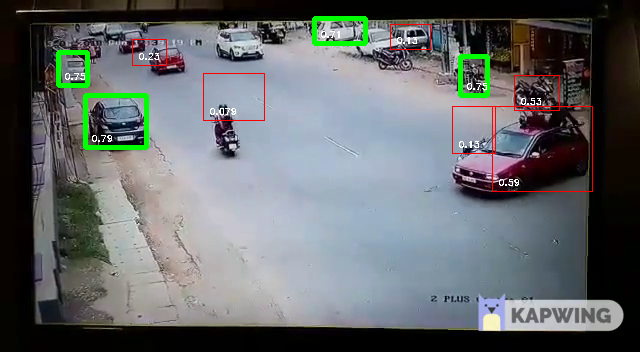

Safe


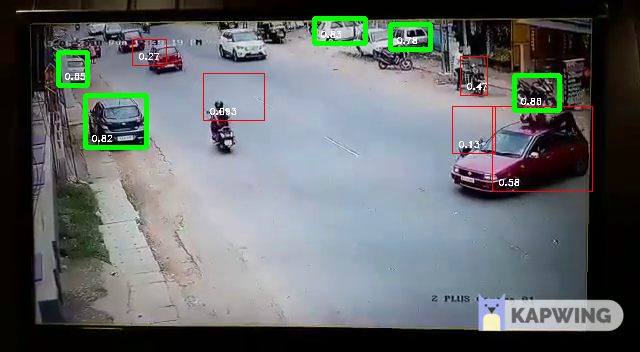

Safe


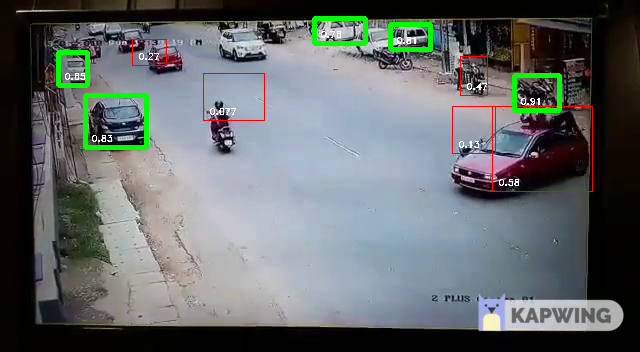

Safe


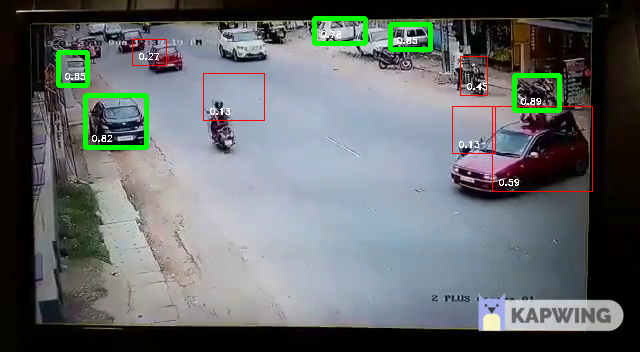

Safe


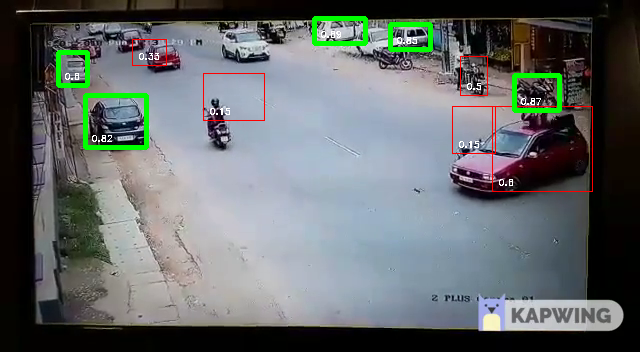

Safe


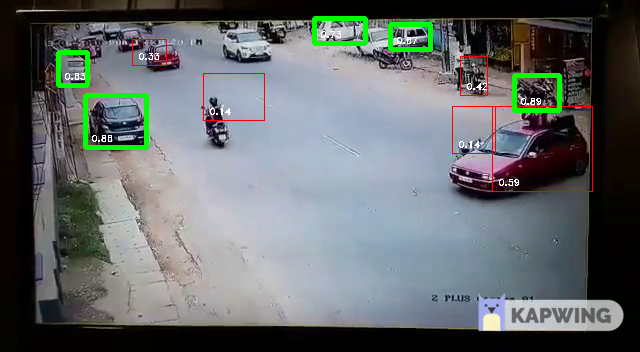

Safe


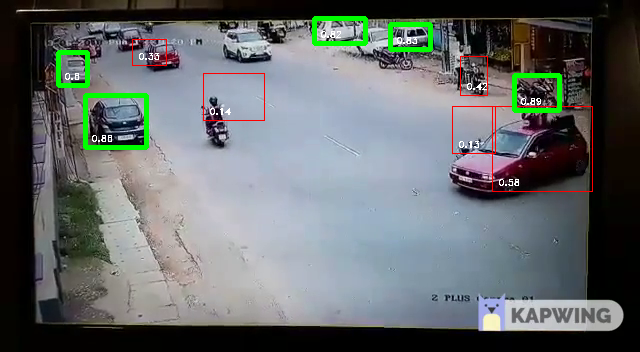

Safe


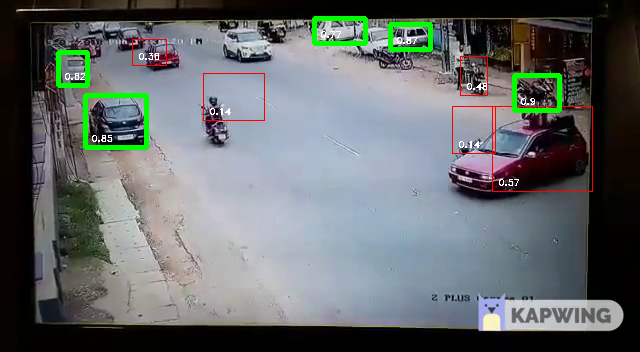

Safe


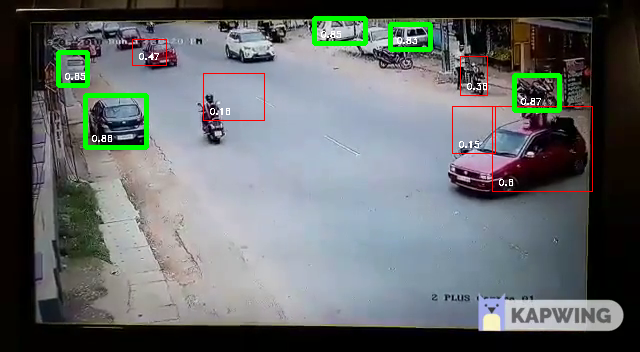

Safe


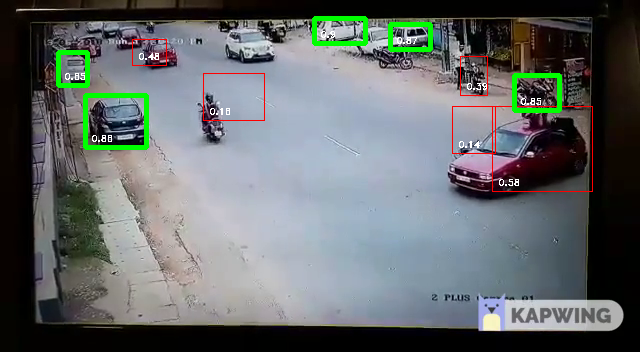

Safe


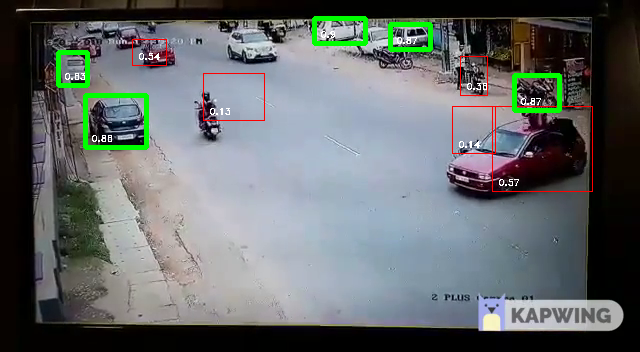

Safe


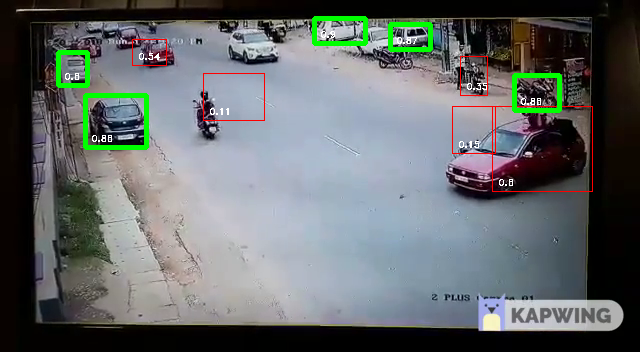

Safe


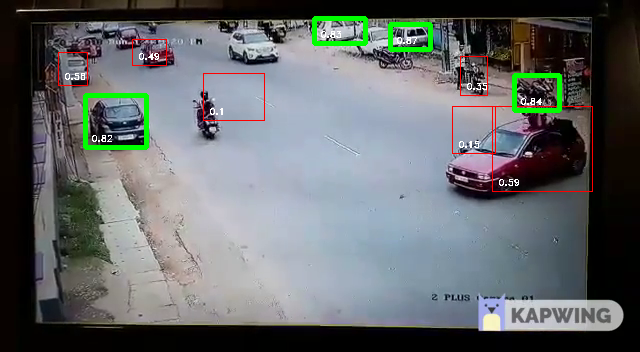

Safe


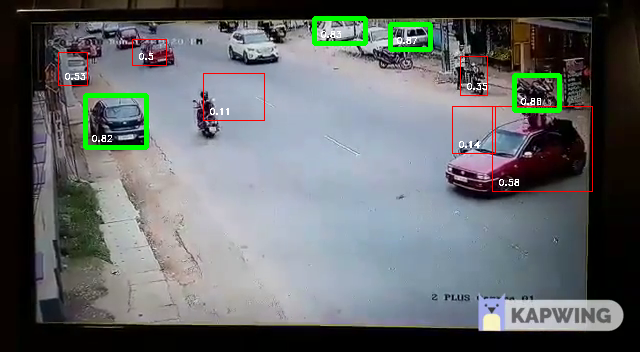

Safe


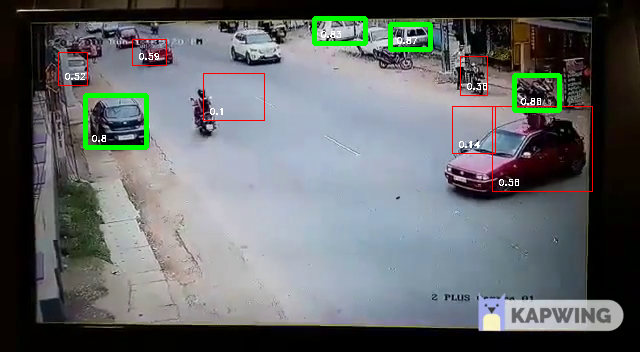

Safe


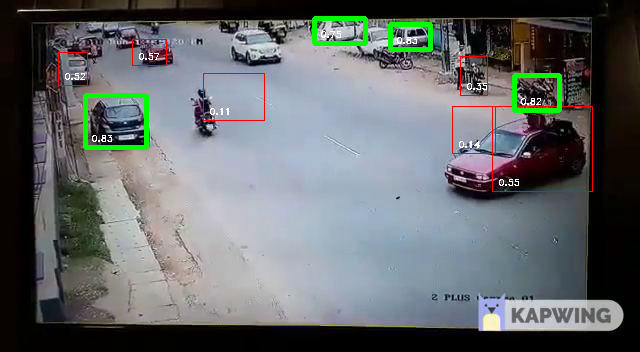

In [17]:
  while video_capture.isOpened():
    success, frame = video_capture.read()
    #frame.set(cv2.CAP_PROP_FPS, 20)
    if not success:
        break

    # BGR -> RGB
    rgb_image = frame[:, :, ::-1]

    # Run the image through the Mask R-CNN model to get results.
    results = model.detect([rgb_image], verbose=0)

    r = results[0]


    if parked_car_boxes is None:
        
        parked_car_boxes = get_car_boxes(r['rois'], r['class_ids'])
    else:
       

        # Get where cars are currently located in the frame
        car_boxes = get_car_boxes(r['rois'], r['class_ids'])

        # those cars which overlap with the known parking spaces
        overlaps = mrcnn.utils.compute_overlaps(parked_car_boxes, car_boxes)

       
        free_space = False
        free_space_frames=0


        for parking_area, overlap_areas in zip(parked_car_boxes, overlaps):

   
            max_IoU_overlap = np.max(overlap_areas)

            
            y1, x1, y2, x2 = parking_area

           
            if max_IoU_overlap >0.60:
                # Parking space not occupied! Draw a green box around it
                cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 3)
                # Flag that we have seen at least one open space
                free_space = True
            else:
                # Parking space is still occupied - draw a red box around it
                cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 0, 255), 1)

            
            font = cv2.FONT_HERSHEY_DUPLEX
            cv2.putText(frame, f"{max_IoU_overlap:0.2}", (x1 + 6, y2 - 6), font, 0.3, (255, 255, 255))

        # If at least one space was free, start counting frames
        # This is so we don't alert based on one frame of a spot being open.
        # This helps prevent the script triggered on one bad detection.
        if free_space:
            free_space_frames += 1
        else:
            # If no spots are free, reset the count
            free_space_frames = 0

        # If a space has been free for several frames,then space is available
        if free_space_frames > 10:
            #prediction=1
            print("Collision!")
        else:
            #prediction=0
            print('Safe')
        
        cv2_imshow(frame)

    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
    #return render_template("index.html",prediction=prediction)

video_capture.release()
cv2.destroyAllWindows()




In [23]:
visualize.display_instances(rgb_image, r['rois'], r['masks'], r['class_ids'],)

TypeError: ignored

In [0]:
import skimage
image = skimage.io.imread('Capture.PNG')

In [28]:
result = model.detect([image], verbose=1)

# Visualize results
r = result[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

Processing 1 images
image                    shape: (830, 1478, 4)        min:    0.00000  max:  255.00000  uint8


ValueError: ignored